In [1]:
import pandas as pd
import plotly.express as px
import os
os.environ['PROJ_LIB'] = r'/Users/qianxiao/anaconda3/share/proj/'
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.basemap import Basemap
from matplotlib.collections import LineCollection
import matplotlib as mpl
from matplotlib.colors import rgb2hex
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## EDA

In [2]:
#Read in the cleaned dataset
df_url = 'https://raw.githubusercontent.com/xenaka/cs109_final_project/master/Datasets/df_merge_CPS.csv'
df_crime_output = pd.read_csv(df_url)

In [3]:
fig = px.scatter_mapbox(df_crime_output, lat="Lat", lon="Long",
                        color='Crime_Type_Cat', color_discrete_sequence=[px.colors.qualitative.Light24[0],
                                                                         px.colors.qualitative.Light24[1],
                                                                         px.colors.qualitative.Light24[2],
                                                                         px.colors.qualitative.Light24[4],
                                                                         px.colors.qualitative.Light24[5],
                                                                         px.colors.qualitative.Light24[7]],
                        zoom=11, height=500)

fig.update_traces(marker=dict(size=3, opacity=0.8))
fig.update_layout(mapbox_style="open-street-map", dragmode=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show(block=False)

In [4]:
#Read in light dataset
df_lights = pd.read_csv('https://data.boston.gov/dataset/52b0fdad-4037-460c-9c92-290f5774ab2b/resource/c2fcc1e3-c38f-44ad-a0cf-e5ea2a6585b5/download/streetlight-locations.csv')

In [5]:
fig_lights = px.scatter_mapbox(df_lights, lat="Lat", lon="Long",
                        color_discrete_sequence=[px.colors.qualitative.Set1[5]], zoom=11, height=500)

fig_lights.update_traces(marker=dict(size=3, opacity=0.3))
fig_lights.update_layout(mapbox_style="open-street-map", dragmode=False)
fig_lights.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_lights.show()

----

In [6]:
#Read in the data for plotting heatmap
url = "https://raw.githubusercontent.com/xenaka/cs109_final_project/master/Datasets/Socioeconomic.csv"
DF = pd.read_csv(url, error_bad_lines=False)
colormap = plt.cm.Reds

(0.0, 87035.6012118304, 0.0, -110668.97244796605)

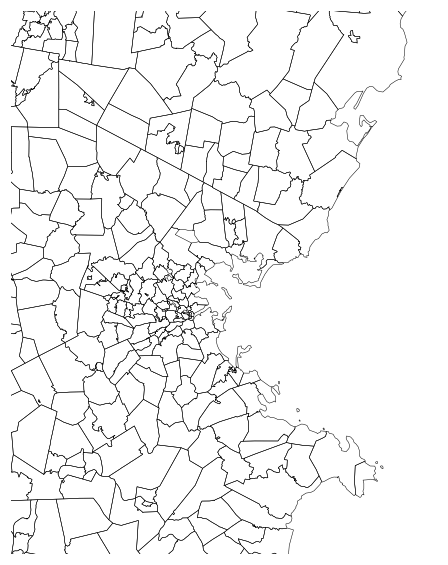

In [13]:
us_shape_file_dir = 'Datasets/cb_2018_us_zcta510_500k/cb_2018_us_zcta510_500k'

# Boston coordinates
lowerlon = -71.5
upperlon = -70.45
lowerlat = 42.8
upperlat = 41.8

#Set up Basemap
m = Basemap(
    llcrnrlon=lowerlon,
    llcrnrlat=lowerlat,
    urcrnrlon=upperlon,
    urcrnrlat=upperlat,
    resolution='c',
    projection='lcc',
    lat_0=lowerlat,
    lat_1=upperlat,
    lon_0=lowerlon,
    lon_1=upperlon
    )

plt.figure(figsize=(10,10)) 
shp_info = m.readshapefile(us_shape_file_dir, 'states',drawbounds=True)
plt.gca().axis("off")

In [14]:
#Convert zip code and population density data to string type
DF['Zip Code'] = DF['Zip Code'].astype(str)
DF['Population Density'] = DF['Population Density'].astype(int)

#create an array of zip codes 
zip_codes = [2026.0,2090.0,2108.0,2109.0,2110.0,2111.0,2112.0,2113.0,2114.0,2115.0,2116.0, 2118.0,2119.0,2120.0,
 2121.0,2122.0,2124.0,2125.0,2126.0,2127.0,2128.0,2129.0,2130.0,2131.0,2132.0,2133.0,2134.0,2135.0,2136.0,2137.0,         2186.0,2199.0,
 2201.0,2210.0,2215.0,2445.0,2446.0,2467.0] #The zip codes were extracted from the property dataset
zip_codes_str = ['0'+str(int(i)) for i in zip_codes]
zip_codes_str = np.asarray(zip_codes_str)

In [15]:
#sqrt the population density data and create it as an array 
desired_array = [int(numeric_string) for numeric_string in DF['Population Density']]
desired_array = np.sqrt(desired_array)

In [16]:
#Create a dictionary contains zipcode as key and sqrt of population density as value 
popdens = {i:j for (i, j) in zip(zip_codes_str,desired_array)}

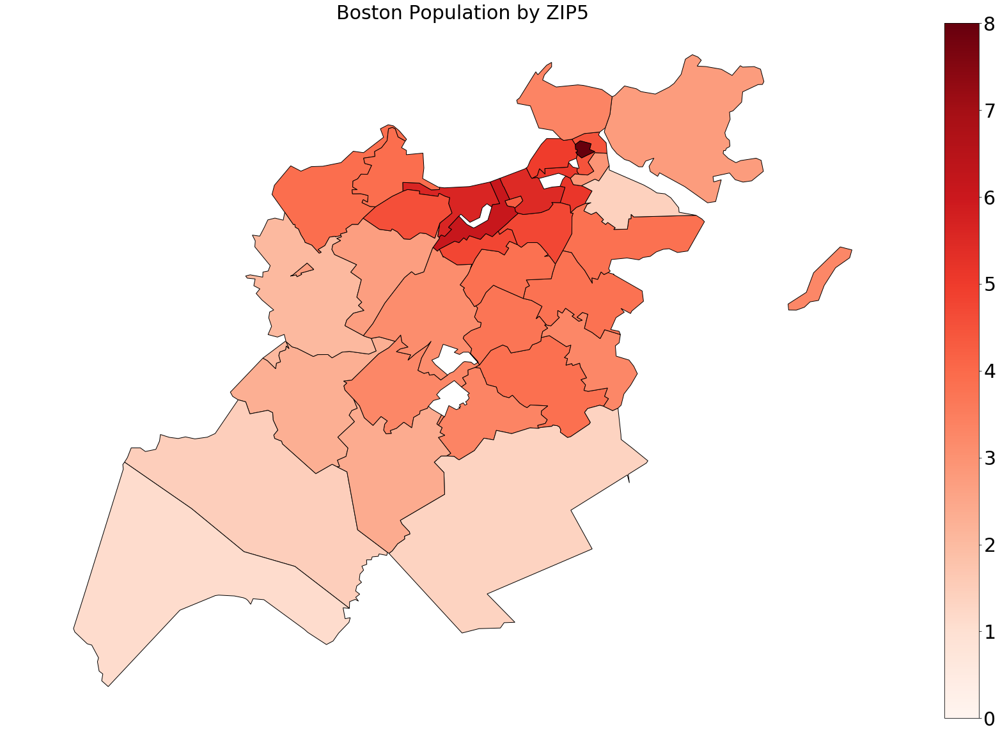

In [17]:
#Exclude the map into only Boston zipcodes and plot  
ziplist = []
colors  = {}
vmin    = 0.
vmax    = 8.

zip_info   = m.states_info
popdiv     = (int(max(popdens.values()))/(vmax-vmin))    
popdensscl = {i:(int(j)/popdiv) for (i,j) in popdens.items()} #categorize population density

plt.figure(figsize=(30, 20))

# Filter m.states_info to only Boston zipcodes.
for d in zip_info:
    iterzip = d["ZCTA5CE10"]
    if iterzip in popdensscl.keys():
        iterpop = popdensscl.get(iterzip,0)
        colors[iterzip] = colormap(iterpop/vmax)[:3]
    ziplist.append(iterzip)
for nshape,seg in enumerate(m.states):
    i, j = zip(*seg)
    if ziplist[nshape] in popdensscl.keys():
        color = rgb2hex(colors[ziplist[nshape]])
        edgecolor = "#000000"
        plt.fill(i,j,color,edgecolor=edgecolor);

# include colorbar.
sm = plt.cm.ScalarMappable(
    cmap=colormap,norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    )
mm = plt.cm.ScalarMappable(cmap=colormap)
mm.set_array([vmin, vmax])
cb = plt.colorbar(mm,ticks=np.arange(vmin, vmax+1, 1),orientation="vertical")
cb.ax.tick_params(labelsize=30)
plt.title("Boston Population by ZIP5",fontdict = {'fontsize' : 30})
plt.gca().axis("off")
plt.show()

-----

## Model Fitting

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split 

In [55]:
#Select the predictor columns to use
pred_col_names = ['SHOOTING_INTEGER','HOUR','AV_BLDG', 'AV_TOTAL', 'LAND_SF', 
                  'GROSS_TAX', 'GROSS_AREA', 'LIVING_AREA', 'NUM_FLOORS',
                  'PTYPE_A', 'PTYPE_C', 'PTYPE_EO', 'PTYPE_EP', 'PTYPE_I', 'PTYPE_MU',
                  'PTYPE_R', 'YR_BUILT_m', 'YR_REMOD_m', 'Population Density', 'Young_prop',
                  'Median household incrom', 'Dist_to_Nearest_Light']

In [56]:
#Create a new column for shooting, with 1 as involving shooting and 0 as no involvement of shooting
df_crime_output['SHOOTING_INTEGER'] = df_crime_output['SHOOTING']
df_crime_output['SHOOTING_INTEGER'] = df_crime_output['SHOOTING_INTEGER'].replace('Y', 1)
df_crime_output['SHOOTING_INTEGER'] = df_crime_output['SHOOTING_INTEGER'].replace(np.nan, 0)

In [57]:
df_crime_output = df_crime_output.dropna(subset = pred_col_names)

In [58]:
np.random.seed(10)

#Split the data into training, test sets and validation sets
X_tv, X_test, y_tv, y_test = train_test_split(df_crime_output, 
                                                         df_crime_output.Crime_Type, test_size=0.2, 
                                                         random_state = 8, 
                                                         stratify = df_crime_output.Crime_Type)

In [59]:
np.random.seed(10)

X_train, X_val, y_train, y_val = train_test_split(X_tv, y_tv, test_size=0.25, 
                                                         random_state = 8, 
                                                         stratify = y_tv)

In [61]:
np.random.seed(10)
model1 = LogisticRegression(C = 100000, multi_class='ovr').fit(X_train.loc[:,pred_col_names], y_train)

In [66]:
print('The accuracy score of the baseline model is :', accuracy_score(y_test.values, model1.predict(X_test.loc[:,pred_col_names])),
     ', which is very bad :(')

The accuracy score of the baseline model is : 0.3144181700567814 , which is very bad :(
